In [154]:
import os
from IPython.display import Image
from IPython.core.display import HTML 
import time
import ast

In [155]:
graphname = 'trab1.graph'

In [27]:
def criarEntrada(v1,e1,v2,e2, graphviz):
    os.system(f'python src/generate.py {v1} {e1} {v2} {e2} {graphviz}')

In [156]:
m=1
criarEntrada(4*m, 5*m, 3*m, 4*m, graphname)

digraph {
	subgraph clusterG1 { graph [label="G"]
		 G4 -> G1 [arrowhead=none]
		 G1 -> G3 [arrowhead=none]
		 G3 -> G2 [arrowhead=none]
		 G2 -> G1 [arrowhead=none]
		 G3 -> G1 [arrowhead=none]
	}
	subgraph clusterG2 { graph [label="g"]
		 g1 -> g2 [arrowhead=none]
		 g2 -> g3 [arrowhead=none]
		 g3 -> g1 [arrowhead=none]
		 g2 -> g1 [arrowhead=none]
	}
}


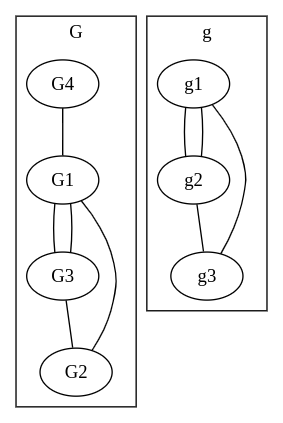

In [158]:
Image(filename= "graph1.png",  width=500, height=500)

In [56]:
def entradaSat(graph):
    os.system(f'python3 src/gen_input.py {graph}')

In [159]:
entradaSat(graphname)

0.0014810562133789062


In [36]:
def satSolve(graphname):
    satin = graphname + '.satinput'
    satout = graphname + '.satoutput'
    os.system(f'./minisat_static {satin} {satout}')

In [160]:
begin = time.time()
satSolve(graphname)
end = time.time()

==================================[MINISAT]===================================
| Conflicts |     ORIGINAL     |              LEARNT              | Progress |
|           | Clauses Literals |   Limit Clauses Literals  Lit/Cl |          |
|         0 |       1        4 |       0       0        0    -nan |  0.000 % |
restarts              : 1
conflicts             : 0              (0 /sec)
decisions             : 1              (352 /sec)
propagations          : 12             (4227 /sec)
conflict literals     : 0              (-nan % deleted)
Memory used           : 2.24 MB
CPU time              : 0.002839 s

SATISFIABLE


In [79]:
def saidaSat2Problem(graphname):
    satout = graphname + '.satoutput'
    mapping = graphname  + '.mapping'
    a = os.popen(f'python src/gen_output.py {satout} {mapping}').read()
    print(a)
    return a

In [161]:
mappingFunction = ast.literal_eval(saidaSat2Problem(graphname).split('\n')[-2])

In [162]:
mappingFunction

{'1': '1', '2': '3', '3': '2'}

In [164]:
def printMappingFunctionGraph(mappingFunction):
  print ('\tsubgraph mapG1G2 { graph [label="m"]')
  for g2, g1 in mappingFunction.items():
    print ("\t\t",  "g"+str(g2), "->", "G"+str(g1) + ' [color = red]')
  print ("\t}")

In [165]:
printMappingFunctionGraph(mappingFunction)

	subgraph mapG1G2 { graph [label="m"]
		 g1 -> G1 [color = red]
		 g2 -> G3 [color = red]
		 g3 -> G2 [color = red]
	}


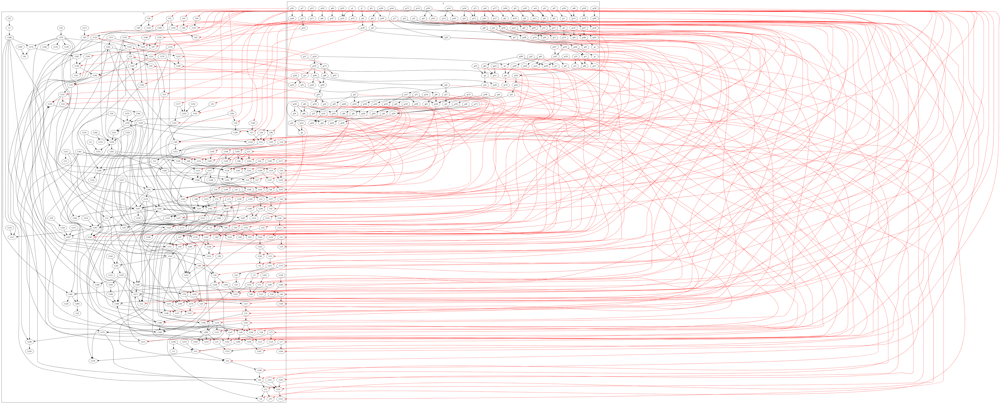

In [89]:
Image(filename= "graph2_mapping.png",  width=500, height=500)

In [90]:
def checkSolution(graphname):
    mapping = graphname  + '.mapping'
    os.system(f'python src/check.py {graphname} {mapping}')

In [91]:
checkSolution(graphname)

True
